In [2]:
# Import libraries/datasets

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
import plotly
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from plotly.offline import iplot, init_notebook_mode
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler


2024-04-09 21:27:35.650466: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Visualize sample data.
##### I have plotted out 5 images for each class (Mild, Moderate, NO_DR, Proliferate_DR, Severe).

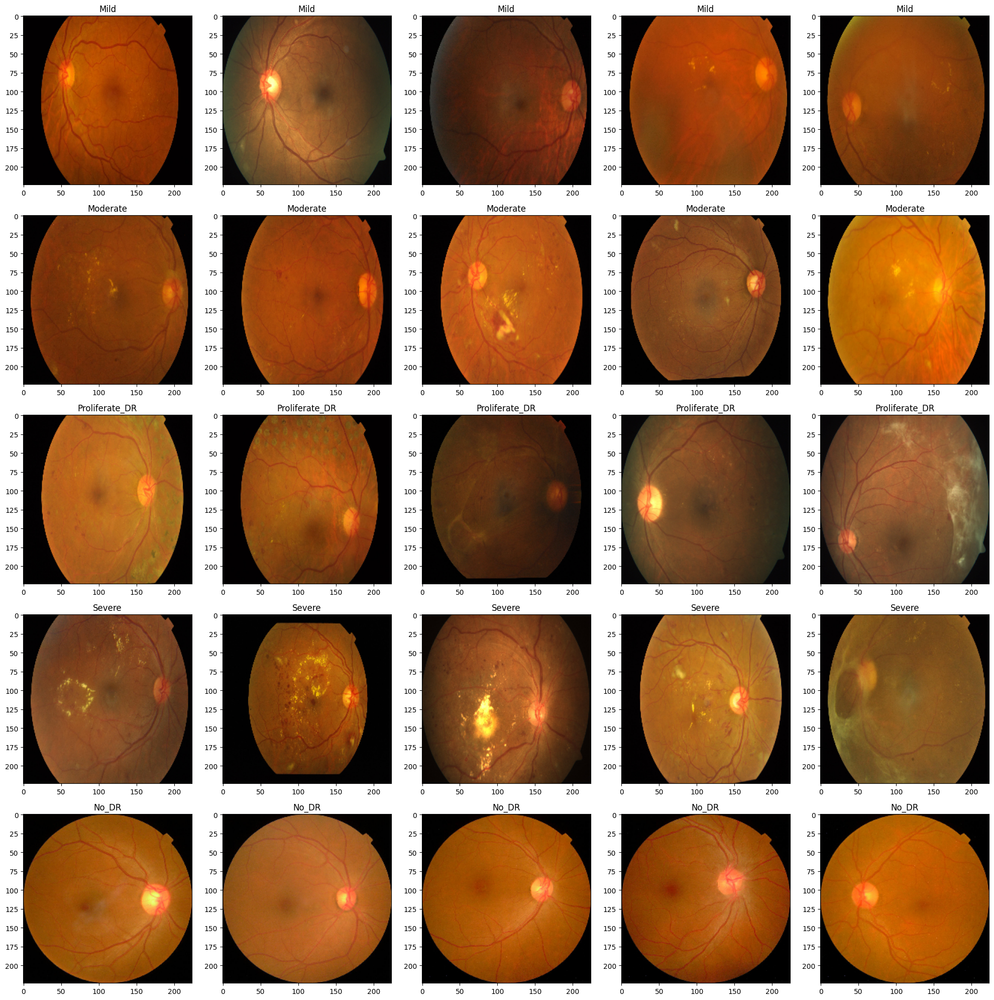

In [10]:
# Visualize 5 images for each class in the dataset

fig, axs = plt.subplots(5, 5, figsize = (20, 20))
count = 0
for i in os.listdir('./data/train'):
  # get the list of images in a given class
  train_class = os.listdir(os.path.join('data/train', i))
  # plot 5 images per class
  for j in range(5):
    img = os.path.join('data/train', i, train_class[j])
    img = PIL.Image.open(img)
    axs[count][j].title.set_text(i)
    axs[count][j].imshow(img)  
  count += 1

fig.tight_layout()

#### Let's first find out the total number of images we will be using and their respective labels

In [3]:
train = []
label = []

for i in os.listdir('./data/train'):
    train_class = os.listdir(os.path.join('data/train', i))
    for j in train_class:
        img = os.path.join('data/train', i, j)
        train.append(img)
        label.append(i)

print('Number of train images = {}'.format(len(train)))

Number of train images = 3662


##### These are the total number of images in each class

In [17]:
images_per_class = []
class_name = []
for i in os.listdir('./data/train'):
  train_class = os.listdir(os.path.join('data/train', i))
  images_per_class.append(len(train_class))
  class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))


Number of images in Mild = 370 

Number of images in Moderate = 999 

Number of images in Proliferate_DR = 295 

Number of images in Severe = 193 

Number of images in No_DR = 1805 



##### I create a dataframe with the training images and their respective labels

In [19]:
retina_df = pd.DataFrame({'Image': train,'Labels': label})
retina_df

,Image,Labels
0,data/train/Mild/2d7666b8884f.png,Mild
1,data/train/Mild/50840c36f0b4.png,Mild
2,data/train/Mild/30cab14951ac.png,Mild
3,data/train/Mild/a8582e346df0.png,Mild
4,data/train/Mild/cab3dfa7962d.png,Mild
...,...,...
3657,data/train/No_DR/6b30767595d8.png,No_DR
3658,data/train/No_DR/2b4c7b5f1f1e.png,No_DR
3659,data/train/No_DR/ab78a66dee6a.png,No_DR
3660,data/train/No_DR/79ade634c633.png,No_DR


### Data augmentation and data generator

In [20]:
# Split training and testing data and shuffle
retina_df = shuffle(retina_df)
train, test = train_test_split(retina_df, test_size = 0.2) # 20% data used for testing and 80% for training

In [23]:
# Create img data generator (2 generators: 1 for training and 1 for testing)
# perform data augmentation on training data.

train_datagen = ImageDataGenerator(rescale = 1./255, 
                                   shear_range = 0.2, 
                                   validation_split = 0.15, 
                                   vertical_flip = True,
                                   rotation_range = 20,
                                   brightness_range = [0.2, 1.0])
test_datagen = ImageDataGenerator(rescale = 1./255)

In [24]:
# Creating datagenerator for training, validation and test dataset.

train_generator = train_datagen.flow_from_dataframe(
    train,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32,
    subset='training')

validation_generator = train_datagen.flow_from_dataframe(
    train,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32,
    subset='validation')

test_generator = test_datagen.flow_from_dataframe(
    test,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32)

Found 2490 validated image filenames belonging to 5 classes.


Found 439 validated image filenames belonging to 5 classes.
Found 733 validated image filenames belonging to 5 classes.


### Res-block building

In [25]:
def res_block(X, filter, stage):
  
  # Convolutional_block
  X_copy = X

  f1 , f2, f3 = filter
    
  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_conv_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = MaxPool2D((2,2))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_conv_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_c')(X)


  # Short path
  X_copy = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_copy', kernel_initializer= glorot_uniform(seed = 0))(X_copy)
  X_copy = MaxPool2D((2,2))(X_copy)
  X_copy = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_copy')(X_copy)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  # Identity Block 1
  X_copy = X


  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_1_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_1_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_1_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_c')(X)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  # Identity Block 2
  X_copy = X


  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_2_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_2_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_2_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_c')(X)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [26]:

input_shape = (256,256,3)

#Input tensor shape
X_input = Input(input_shape)

#Zero-padding

X = ZeroPadding2D((3,3))(X_input)

# 1 - stage

X = Conv2D(64, (7,7), strides= (2,2), name = 'conv1', kernel_initializer= glorot_uniform(seed = 0))(X)
X = BatchNormalization(axis =3, name = 'bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3,3), strides= (2,2))(X)

# 2- stage

X = res_block(X, filter= [64,64,256], stage= 2)

# 3- stage

X = res_block(X, filter= [128,128,512], stage= 3)

# 4- stage

X = res_block(X, filter= [256,256,1024], stage= 4)


# Average Pooling

X = AveragePooling2D((2,2), name = 'Averagea_Pooling')(X)

# Final layer

X = Flatten()(X)
X = Dense(5, activation = 'softmax', name = 'Dense_final', kernel_initializer= glorot_uniform(seed=0))(X)


model = Model( inputs= X_input, outputs = X, name = 'Resnet18')

model.summary()

Model: "Resnet18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1 (Conv2D)      │ (None, 128, 128,  │      9,472 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_conv1            │ (None, 128, 128,  │        256 │ conv1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ bn_conv1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 63, 63,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_a        │ (None, 63, 63,    │      4,160 │ max_pooling2d[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 31, 31,    │          0 │ res_2_conv_a[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2_conv_a         │ (None, 31, 31,    │        256 │ max_pooling2d_1[… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 31, 31,    │          0 │ bn_2_conv_a[0][0] │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_b        │ (None, 31, 31,    │     36,928 │ activation_1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2_conv_b         │ (None, 31, 31,    │        256 │ res_2_conv_b[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 31, 31,    │          0 │ bn_2_conv_b[0][0] │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_copy     │ (None, 63, 63,    │     16,640 │ max_pooling2d[0]… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_c        │ (None, 31, 31,    │     16,640 │ activation_2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 31, 31,    │          0 │ res_2_conv_copy[… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2_conv_c         │ (None, 31, 31,    │      1,024 │ res_2_conv_c[0][

 Total params: 4,987,525 (19.03 MB)

 Trainable params: 4,967,685 (18.95 MB)

 Non-trainable params: 19,840 (77.50 KB)

In [44]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics= ['accuracy'])
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
checkpointer = ModelCheckpoint(filepath="weights.keras", verbose=1, save_best_only=True)
history = model.fit(train_generator, steps_per_epoch = train_generator.n // 32, epochs = 10, validation_data= validation_generator, validation_steps= validation_generator.n // 32, callbacks=[checkpointer , earlystopping])

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6169 - loss: 1.0358
Epoch 1: val_loss improved from inf to 1.32576, saving model to weights.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 257s 3s/step - accuracy: 0.6173 - loss: 1.0350 - val_accuracy: 0.4928 - val_loss: 1.3258
Epoch 2/10
 1/77 ━━━━━━━━━━━━━━━━━━━━ 3:41 3s/step - accuracy: 0.6875 - loss: 0.7609

2024-04-09 20:07:10.366539: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]



Epoch 2: val_loss improved from 1.32576 to 0.73983, saving model to weights.keras


2024-04-09 20:07:10.757421: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


77/77 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.6875 - loss: 0.3854 - val_accuracy: 0.4783 - val_loss: 0.7398
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7004 - loss: 0.8416
Epoch 3: val_loss did not improve from 0.73983
77/77 ━━━━━━━━━━━━━━━━━━━━ 240s 3s/step - accuracy: 0.7003 - loss: 0.8418 - val_accuracy: 0.4159 - val_loss: 1.3077
Epoch 4/10
 1/77 ━━━━━━━━━━━━━━━━━━━━ 3:42 3s/step - accuracy: 0.6562 - loss: 0.7936

2024-04-09 20:11:13.945864: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]



Epoch 4: val_loss improved from 0.73983 to 0.69196, saving model to weights.keras


2024-04-09 20:11:14.344034: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


77/77 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.6562 - loss: 0.4019 - val_accuracy: 0.3043 - val_loss: 0.6920
Epoch 5/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7160 - loss: 0.7987
Epoch 5: val_loss did not improve from 0.69196
77/77 ━━━━━━━━━━━━━━━━━━━━ 302s 4s/step - accuracy: 0.7158 - loss: 0.7992 - val_accuracy: 0.6370 - val_loss: 0.9722
Epoch 6/10
 1/77 ━━━━━━━━━━━━━━━━━━━━ 4:53 4s/step - accuracy: 0.6562 - loss: 0.6905

2024-04-09 20:16:20.492044: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]



Epoch 6: val_loss improved from 0.69196 to 0.54073, saving model to weights.keras


2024-04-09 20:16:20.915713: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6562 - loss: 0.3497 - val_accuracy: 0.6522 - val_loss: 0.5407
Epoch 7/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6925 - loss: 0.8246
Epoch 7: val_loss did not improve from 0.54073
77/77 ━━━━━━━━━━━━━━━━━━━━ 269s 3s/step - accuracy: 0.6926 - loss: 0.8243 - val_accuracy: 0.7091 - val_loss: 0.8986
Epoch 8/10
 1/77 ━━━━━━━━━━━━━━━━━━━━ 3:47 3s/step - accuracy: 0.7188 - loss: 0.9216

2024-04-09 20:20:53.594582: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]



Epoch 8: val_loss improved from 0.54073 to 0.40149, saving model to weights.keras


2024-04-09 20:20:54.004160: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


77/77 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7188 - loss: 0.4668 - val_accuracy: 0.6957 - val_loss: 0.4015
Epoch 9/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7174 - loss: 0.7895
Epoch 9: val_loss did not improve from 0.40149
77/77 ━━━━━━━━━━━━━━━━━━━━ 264s 3s/step - accuracy: 0.7174 - loss: 0.7897 - val_accuracy: 0.6659 - val_loss: 0.8462
Epoch 10/10
 1/77 ━━━━━━━━━━━━━━━━━━━━ 3:50 3s/step - accuracy: 0.7500 - loss: 0.8332

2024-04-09 20:25:21.269567: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]



Epoch 10: val_loss did not improve from 0.40149
77/77 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7500 - loss: 0.4220 - val_accuracy: 0.4783 - val_loss: 0.6508


2024-04-09 20:25:21.701968: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


Training loss history: [0.9693856239318848, 0.3804667592048645, 0.8582557439804077, 0.396779328584671, 0.8352627158164978, 0.34524035453796387, 0.7991921305656433, 0.46079933643341064, 0.7982110977172852, 0.41658106446266174]
Validation loss history: [1.3257637023925781, 0.7398251891136169, 1.3077282905578613, 0.69195556640625, 0.9722052216529846, 0.5407257080078125, 0.8985503911972046, 0.40149256587028503, 0.8462117910385132, 0.650837242603302]


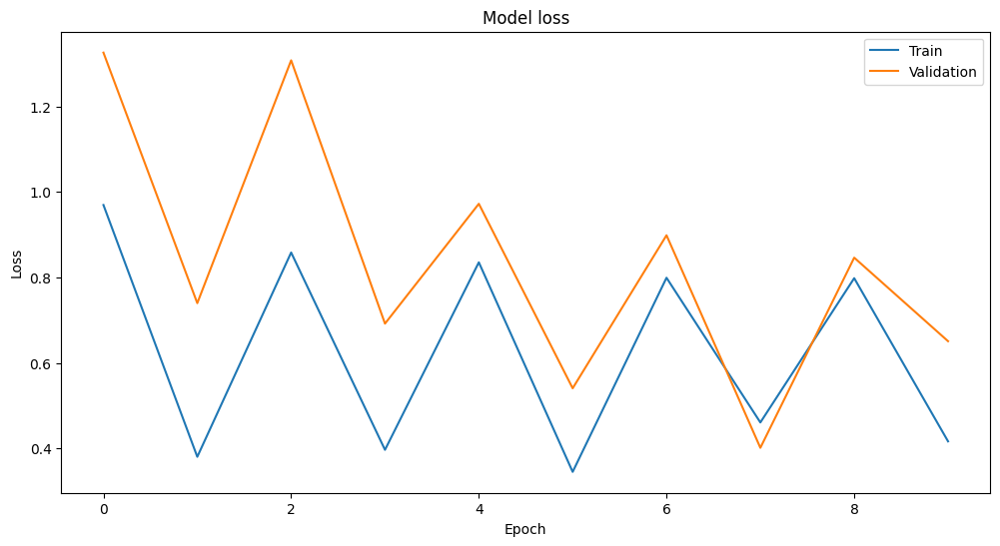

In [45]:
print("Training loss history:", history.history['loss'])
print("Validation loss history:", history.history['val_loss'])

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

### Analyzing the model performance over already trained data

In [48]:
model.load_weights("data/retina_weights.hdf5")
evaluate = model.evaluate(test_generator, steps = test_generator.n // 32, verbose =1)

print('Accuracy Test : {}'.format(evaluate[1]))

22/22 ━━━━━━━━━━━━━━━━━━━━ 15s 668ms/step - accuracy: 0.8539 - loss: 0.4117
Accuracy Test : 0.8579545617103577


In [49]:
labels = {0: 'Mild', 1: 'Moderate', 2: 'No_DR', 3:'Proliferate_DR', 4: 'Severe'}

In [51]:
# Loading images and their predictions 

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

prediction = []
original = []
image = []
count = 0

for item in range(len(test)):

  img= PIL.Image.open(test['Image'].tolist()[item])
  img = img.resize((256,256))
  image.append(img)
  img = np.asarray(img, dtype= np.float32)
  img = img / 255
  img = img.reshape(-1,256,256,3)
  predict = model.predict(img)
  predict = np.argmax(predict)
  prediction.append(labels[predict])
  original.append(test['Labels'].tolist()[item])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━

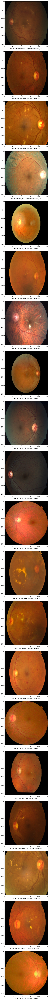

In [52]:
import random
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

##### Classification report 

In [53]:
print(classification_report(np.asarray(original), np.asarray(prediction)))

                precision    recall  f1-score   support

          Mild       0.78      0.66      0.72        74
      Moderate       0.73      0.85      0.78       195
         No_DR       0.97      0.97      0.97       371
Proliferate_DR       0.57      0.50      0.53        52
        Severe       0.92      0.56      0.70        41

      accuracy                           0.85       733
     macro avg       0.79      0.71      0.74       733
  weighted avg       0.85      0.85      0.85       733



##### Confusion matrix

Text(0.5, 1.0, 'Confusion_matrix')

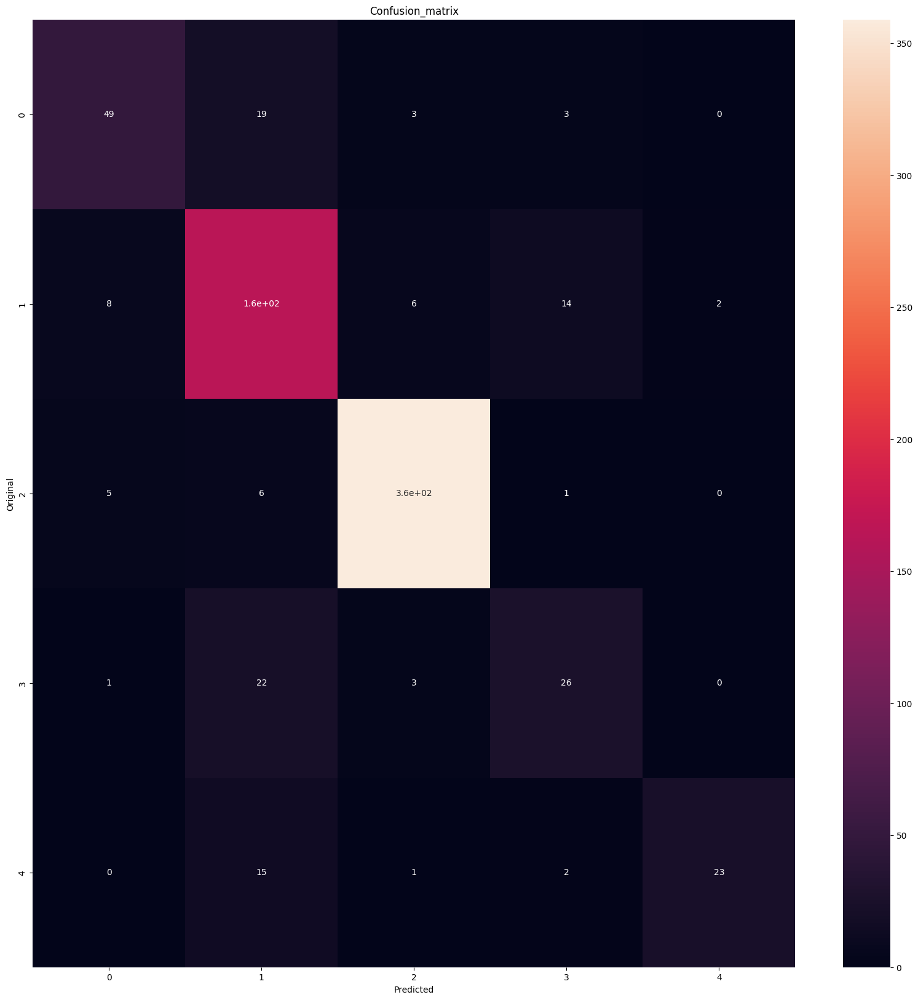

In [54]:
plt.figure(figsize = (20,20))
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax)

ax.set_xlabel('Predicted')
ax.set_ylabel('Original')
ax.set_title('Confusion_matrix')